In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('../Data/encoded_movies_data.csv')
df.head()

,Title,Year,Duration,MPA,budget,directors,writers,stars,production_companies,Category,Profit,Hit
0,1. Star Wars: Episode III - Revenge of the Sith,2005,140.0,PG-13,113000000.0,2105,2308,2155,3300,4,752.243925,1
1,"2. The Chronicles of Narnia: The Lion, the Wit...",2005,143.0,PG,180000000.0,355,490,5487,5179,4,413.896175,1
2,3. Harry Potter and the Goblet of Fire,2005,157.0,PG-13,150000000.0,4222,6201,1326,5188,5,598.312635,1
3,4. War of the Worlds,2005,117.0,PG-13,132000000.0,5678,3431,5535,3944,4,457.479927,1
4,5. King Kong,2005,187.0,PG-13,207000000.0,4705,2186,4183,5082,4,269.036898,1


In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

X = df[['budget', 'Category', 'directors', 'stars', 'production_companies', 'writers']].copy()
y = df['Hit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [4]:
# !pip install lightgbm

In [5]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()

lgbm.fit(X_train, y_train)

lgbm.score(X_train, y_train), lgbm.score(X_test, y_test)

[LightGBM] [Info] Number of positive: 2395, number of negative: 6165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1280
[LightGBM] [Info] Number of data points in the train set: 8560, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.279790 -> initscore=-0.945505
[LightGBM] [Info] Start training from score -0.945505


(0.8753504672897197, 0.7990654205607477)

In [6]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = lgbm.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1457  111]
 [ 319  253]]
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      1568
           1       0.70      0.44      0.54       572

    accuracy                           0.80      2140
   macro avg       0.76      0.69      0.71      2140
weighted avg       0.79      0.80      0.78      2140



In [7]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier

param_grid = {
    'num_leaves': [7, 15, 31, 63, 127],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 7],
    'random_state': [42]
}
model = LGBMClassifier()
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

[LightGBM] [Info] Number of positive: 1596, number of negative: 4110
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 5706, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.279706 -> initscore=-0.945923
[LightGBM] [Info] Start training from score -0.945923
[LightGBM] [Info] Number of positive: 1597, number of negative: 4110
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1276
[LightGBM] [Info] Number of data points in the train set: 5707, number of used features: 6
[LightGBM] [Info] [binary:

In [8]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = grid_search.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1439  129]
 [ 280  292]]
              precision    recall  f1-score   support

           0       0.84      0.92      0.88      1568
           1       0.69      0.51      0.59       572

    accuracy                           0.81      2140
   macro avg       0.77      0.71      0.73      2140
weighted avg       0.80      0.81      0.80      2140



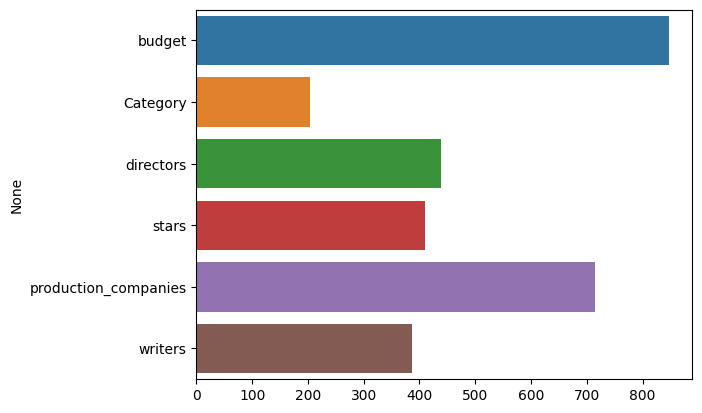

In [9]:
feature_importances = lgbm.feature_importances_
features = X.columns

sns.barplot(x=feature_importances, y=features, hue=features)
plt.show()

In [15]:
le = LabelEncoder()
df['MPA'] = le.fit_transform(df['MPA'])
X = df[['budget', 'Category', 'directors', 'stars', 'production_companies', 'writers' ,'MPA', 'Duration']].copy()
y = df['Hit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lgbm = LGBMClassifier()
# lgbm = LGBMClassifier(learning_rate=0.2, n_estimators=100, max_depth=5, num_leaves=15, random_state=42)

lgbm.fit(X_train, y_train)

lgbm.score(X_train, y_train), lgbm.score(X_test, y_test)

[LightGBM] [Info] Number of positive: 2395, number of negative: 6165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1425
[LightGBM] [Info] Number of data points in the train set: 8560, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.279790 -> initscore=-0.945505
[LightGBM] [Info] Start training from score -0.945505


(0.8995327102803738, 0.8037383177570093)

In [16]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = lgbm.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1421  147]
 [ 273  299]]
              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1568
           1       0.67      0.52      0.59       572

    accuracy                           0.80      2140
   macro avg       0.75      0.71      0.73      2140
weighted avg       0.79      0.80      0.80      2140



In [12]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier

param_grid = {
    'num_leaves': [7, 15, 31, 63, 127],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 7],
    'random_state': [42]
}
model = LGBMClassifier()
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

[LightGBM] [Info] Number of positive: 1596, number of negative: 4110
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1413
[LightGBM] [Info] Number of data points in the train set: 5706, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.279706 -> initscore=-0.945923
[LightGBM] [Info] Start training from score -0.945923
[LightGBM] [Info] Number of positive: 1597, number of negative: 4110
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1410
[LightGBM] [Info] Number of data points in the train set: 5707, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.279832 -> initscore=-0.945296
[LightGBM]

In [13]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = grid_search.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1435  133]
 [ 273  299]]
              precision    recall  f1-score   support

           0       0.84      0.92      0.88      1568
           1       0.69      0.52      0.60       572

    accuracy                           0.81      2140
   macro avg       0.77      0.72      0.74      2140
weighted avg       0.80      0.81      0.80      2140



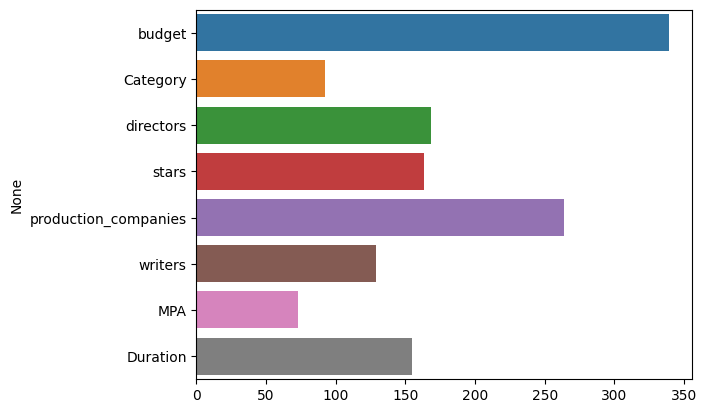

In [14]:
feature_importances = lgbm.feature_importances_

sns.barplot(x=feature_importances, y=X.columns, hue=X.columns)

plt.show()